<a href="https://colab.research.google.com/github/rajesh1996/K-means---Superpixels---SLIC/blob/main/Copy_of_Rajeshwar_N_S_116921237__Superpixels.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Assignment 1
<!-- Understanding and implementing SLIC Superpixels. -->
A superpixel can be defined as a group of pixels that share common characteristics. Simple Linear Iterative Clustering (SLIC) generates superpixels by clustering pixels based on their color similarity and proximity in the image plane. The purpose of this assignment is to understand and implement SLIC Superpixels.

Some pointers before we start:
- Please follow all submission guidlines which are posted on piazza.
- Ensure all outputs are displayed while rendering the PDF.
- Only modify the code blocks  which has a "TODO".
- Below you can see some outputs for an image of a cow. These images represent the kind of output that is expected. 
- Feel free to reach out to any of the TAs for any doubts/issues.

Let's download the dataset first.

In [ ]:
!wget http://download.microsoft.com/download/A/1/1/A116CD80-5B79-407E-B5CE-3D5C6ED8B0D5/msrc_objcategimagedatabase_v1.zip

--2020-11-01 23:46:57--  http://download.microsoft.com/download/A/1/1/A116CD80-5B79-407E-B5CE-3D5C6ED8B0D5/msrc_objcategimagedatabase_v1.zip
Resolving download.microsoft.com (download.microsoft.com)... 23.60.72.32, 2600:1409:12:2af::e59, 2600:1409:12:285::e59
Connecting to download.microsoft.com (download.microsoft.com)|23.60.72.32|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 44119839 (42M) [application/octet-stream]
Saving to: ‘msrc_objcategimagedatabase_v1.zip’

msrc_objcategimaged 100%[===================>]  42.08M   219MB/s    in 0.2s    

2020-11-01 23:46:57 (219 MB/s) - ‘msrc_objcategimagedatabase_v1.zip’ saved [44119839/44119839]



In [ ]:
!unzip --qq msrc_objcategimagedatabase_v1.zip

We only focus on six images in this assignment.

In [ ]:
im_list = ['MSRC_ObjCategImageDatabase_v1/1_22_s.bmp',
           'MSRC_ObjCategImageDatabase_v1/1_27_s.bmp',
           'MSRC_ObjCategImageDatabase_v1/3_3_s.bmp',
           'MSRC_ObjCategImageDatabase_v1/3_6_s.bmp',
           'MSRC_ObjCategImageDatabase_v1/6_5_s.bmp',
           'MSRC_ObjCategImageDatabase_v1/7_19_s.bmp']

In [ ]:
#All important functions to plot, do not modify this block
%matplotlib inline
import cv2
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.patches as mpatches

def plot_image(im,title,xticks=[],yticks= [],isCv2 = True):
    """
    im :Image to plot
    title : Title of image 
    xticks : List of tick values. Defaults to nothing
    yticks :List of tick values. Defaults to nothing 
    cv2 :Is the image cv2 image? cv2 images are BGR instead of RGB. Default True
    """
    plt.figure()
    if isCv2:
        im = im[:,:,::-1]
    plt.imshow(im)
    plt.title(title)
    plt.xticks(xticks)
    plt.yticks(yticks)

def superpixel_plot(im,seg,title = "Superpixels"):
    """
    Given an image (nXmX3) and pixelwise class mat (nXm), 
    1. Consider each class as a superpixel
    2. Calculate mean superpixel value for each class
    3. Replace the RGB value of each pixel in a class with the mean value  
    
    Inputs:
    im: Input image
    seg: Segmentation map
    title: Title of the plot 
    
    Output: None
    Creates a plot    
    """
    clust = np.unique(seg)
    mapper_dict = {i: im[seg == i].mean(axis = 0)/255. for i in clust}

    seg_img =  np.zeros((seg.shape[0],seg.shape[1],3))
    for i in clust:
        seg_img[seg == i] = mapper_dict[i]
    
    plot_image(seg_img,title)
    
    return    

def rgb_segment(seg,n = None,plot = True,title=None,legend = True,color = None):
    """
    Given a segmentation map, get the plot of the classes
    """
    clust = np.unique(seg)
    if n is None:
        n = len(clust)
    if color is None:
        cm = plt.cm.get_cmap('hsv',n+1)
        # mapper_dict = {i:np.array(cm(i/n)) for i in clust}
        mapper_dict = {i:np.random.rand(3,) for i in clust} 
    #elif color == 'mean':
        #TODO..get the mean color of cluster center and assign that to mapper_dict

    seg_img =  np.zeros((seg.shape[0],seg.shape[1],3))
    for i in clust:
        seg_img[seg == i] = mapper_dict[i][:3]

    if plot: 
        plot_image(seg_img,title = title)
    if legend:
        # get the colors of the values, according to the 
        # colormap used by imshow
        patches = [ mpatches.Patch(color=mapper_dict[i], label=" : {l}".format(l=i) ) for i in range(n) ]
        # put those patched as legend-handles into the legend
        plt.legend(handles=patches, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0. )
        plt.grid(True)
        plt.show()

    return seg_img

Let's see what the six images are:

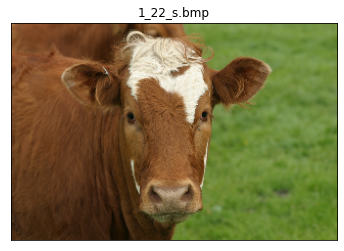

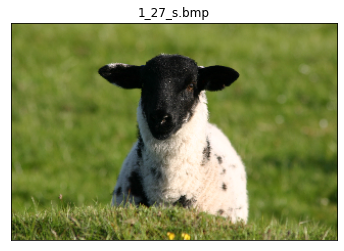

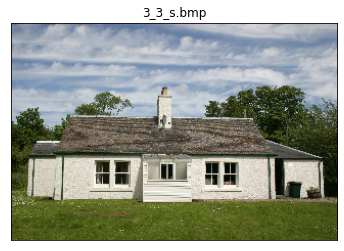

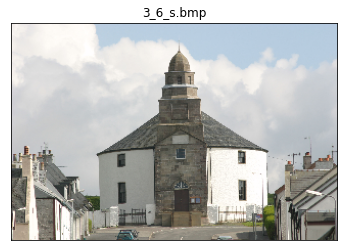

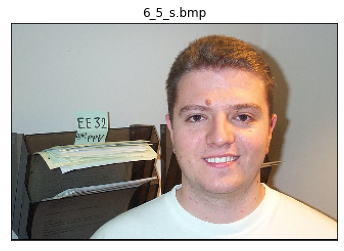

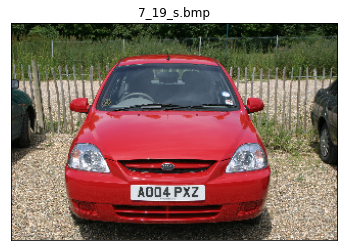

In [ ]:
for i in im_list:
    plot_image(cv2.imread(i),i.split("/")[-1])

Get image and visualize it. Its a scenery with 3 elements. You can see the segmentation ground truth in the GT bitmap.  

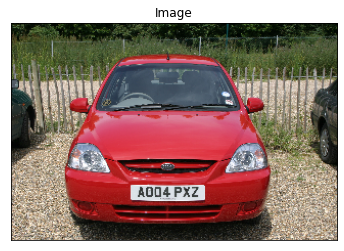

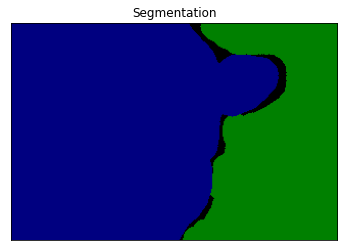

In [ ]:
im = cv2.imread(im_list[0])
im2 = cv2.imread(im_list[1])
im3 = cv2.imread(im_list[2])
im4 = cv2.imread(im_list[3])
im5 = cv2.imread(im_list[4])
im6 = cv2.imread(im_list[5])
seg = cv2.imread(im_list[0].replace("_s","_s_GT"))
plot_image(im6,"Image")
plot_image(seg,"Segmentation")


###Question 1: K-means on RGB
We know k-means clustering algorithm. It is an unsupervised algorithm which minimizes **ANSWER: ** decreases the squared distances of the cluster centroids (Euclidian) or intra cluster variance

Complete the pixel clustering function. It should take input an image (dim = (n $\times$ m  $\times$ 3)) and number of clusters needed. 
Does K means clustering work on image pixels?
Let the number of clusters be K = 5, 10, 50




In [ ]:
def cluster_pixels(im,K):
  # Make a copy of img
  im1 = im
  # Normalize the image
  # im = im / 255
  # Convert the image to 2D
  im = im.reshape(im.shape[0]*im.shape[1],im.shape[2])
  # initialize K centroids
  centroids = np.zeros((K,im.shape[1]))
  
  # select K random centroids from image pixels
  for i in range(K):
    centroids[i,:] = im[np.random.randint(0,im.shape[0]),:]
  
  # Loop 10 times
  for iters in range(10):
    # Initialize the pixel labels array
    pixel_labels = np.zeros((im.shape[0],1),dtype=np.int32)
    # Initialize the distances array
    distances_from_centroids = np.zeros((im.shape[0],K))

    for j in range(K):
      # calculate the Euclidian distances from every centroid to every pixel
      distances_from_centroids[:,j] = np.sqrt(np.sum(np.power(im - centroids[j,:], 2), 1))
      # Assign every pixel in the image to the closest centroid based on the minimum distance
      pixel_labels = np.argmin(distances_from_centroids,axis=1)
    
    for j in range(K):
      centroid_pixel_values = im[pixel_labels== j, :]
      # If no pixels hasnt been assigned to a centroid
      if len(centroid_pixel_values)==0:
        centroids[j,:] = im[np.random.randint(0,im.shape[0]),:]
      # calculate the new centroid by taking means of each clustered pixels 
      else:
        centroids[j,:] = np.mean(centroid_pixel_values,axis=0)
  # Convert the labels as 2D array
  pixel_labels = pixel_labels.reshape(im1.shape[0],im1.shape[1])
  # Return the 2D segmentation map
  return pixel_labels




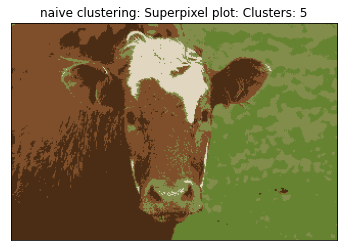

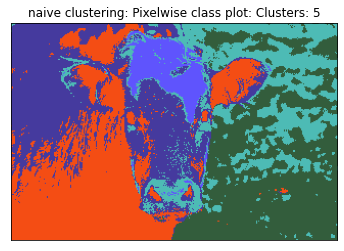

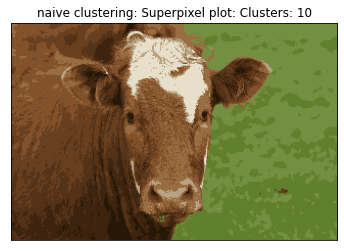

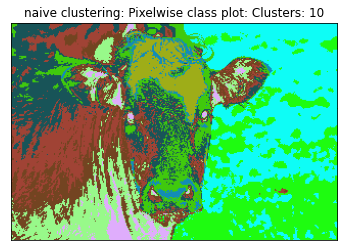

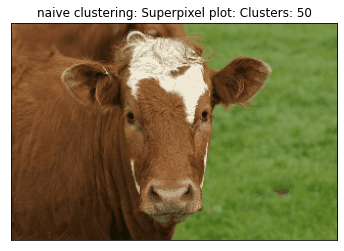

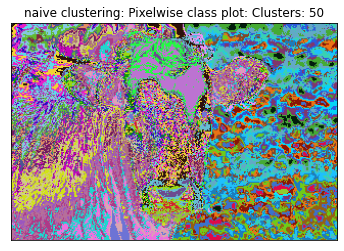

In [ ]:
for k in [5,10,50]:
  pixel_labels = cluster_pixels(im,k)
  superpixel_plot(im,pixel_labels,title =  "naive clustering: Superpixel plot: Clusters: "+ str(k))
  _ = rgb_segment(pixel_labels,n=k, title =  "naive clustering: Pixelwise class plot: Clusters: " + str(k),legend = False)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  app.launch_new_instance()


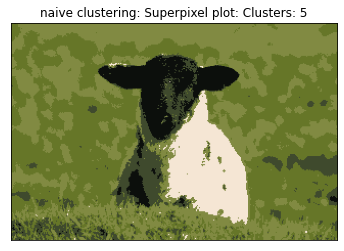

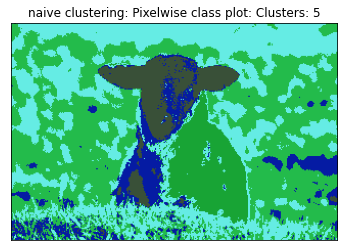

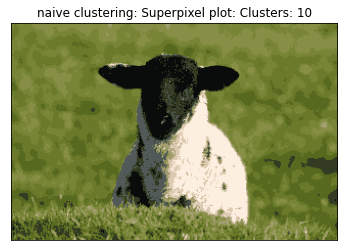

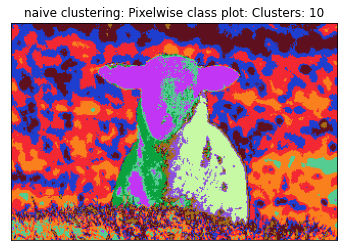

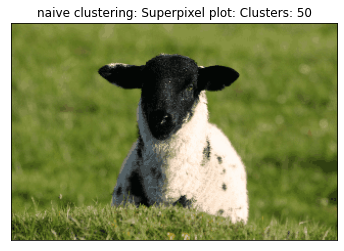

...

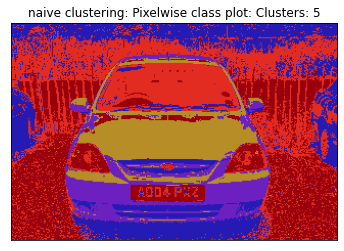

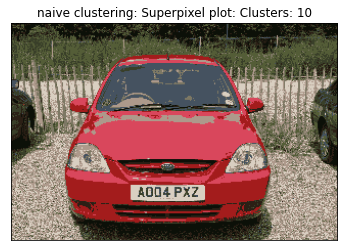

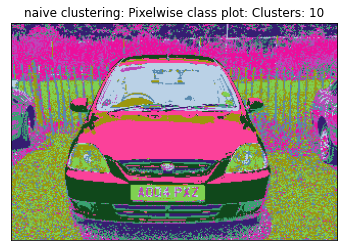

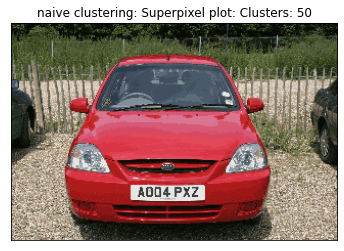

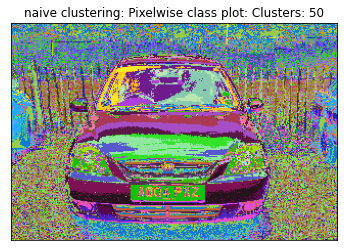

In [ ]:
for image in [im2,im3,im4,im5,im6]:
  for k in [5,10,50]:
    pixel_labels = cluster_pixels(image,k)
    superpixel_plot(image,pixel_labels,title =  "naive clustering: Superpixel plot: Clusters: "+ str(k))
    _ = rgb_segment(pixel_labels,n=k, title =  "naive clustering: Pixelwise class plot: Clusters: " + str(k),legend = False)



In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


###Question 2: Now that you have a function handy, we have a slightly complex task

Instead of making clustering run on RGB space, run the clustering on RGBXY space. What advantages does that give us? 

Since the spatial parameters are included i.e coordinates of the pixel, we can group clusters based on the spatial variance. We can also choose a factor of how much RGB and spatial parameters can influence the clustering which could be seen in the next cell.

(try with clusters = 5, 10, 25, 50, 150)

In [ ]:
#TODO: clustering r,b,g,x,y values 
#try k = 20,80,200,400,800

def cluster_rgbxy(im,K):
  # Make a copy of img
  im1 = im
  #Normalize the image
  im = im / 255
  centroids = np.zeros((K,5))
  # Modify the image array to contain spatial coordinates along with rgb
  img_rgb_xy = np.ndarray((im.shape[0]*im.shape[1],5),dtype=float)
  for y in range(0,im.shape[0]):
    for x in range(0,im.shape[1]):
      img_rgb_xy[x+y*im.shape[1],0] = im[y][x][0]
      img_rgb_xy[x+y*im.shape[1],1] = im[y][x][1]
      img_rgb_xy[x+y*im.shape[1],2] = im[y][x][2]
      img_rgb_xy[x+y*im.shape[1],3] = x
      img_rgb_xy[x+y*im.shape[1],4] = y
  for i in range(K):
      centroids[i,:] = img_rgb_xy[np.random.randint(0,img_rgb_xy.shape[0]),:]
  for iters in range(10):
      # Initialize the pixel labels array
      pixel_labels = np.zeros((img_rgb_xy.shape[0],1),dtype=np.int32)
      # Initialize the distances array
      distances_from_centroids = np.zeros((img_rgb_xy.shape[0],K))

      for j in range(K):
          # calculate the Euclidian distances from every centroid's rgb-xy to every pixel's rgb-xy
        distances_from_centroids[:,j] = np.sqrt(np.sum(np.power(img_rgb_xy - centroids[j,:], 2), 1))
        # Assign every pixel in the image to the closest centroid based on the minimum distance
        pixel_labels = np.argmin(distances_from_centroids,axis=1)

      for j in range(K):
        centroid_pixel_values = img_rgb_xy[pixel_labels== j, :]
        # If no pixels hasnt been assigned to a centroid
        if len(centroid_pixel_values)==0:
          centroids[j,:] = img_rgb_xy[np.random.randint(0,img_rgb_xy.shape[0]),:]
        # calculate the new centroid by taking means of each clustered pixels 
        else:
          centroids[j,:] = np.mean(centroid_pixel_values,axis=0)
  # Convert the labels as 2D array
  pixel_labels = pixel_labels.reshape(im1.shape[0],im1.shape[1])
  # Return the 2D segmentation map

 
  return pixel_labels




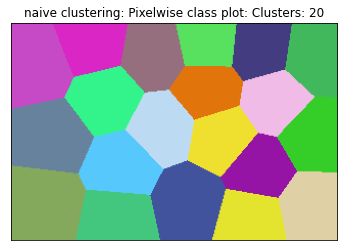

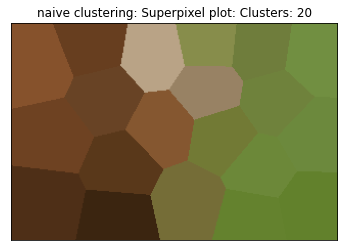

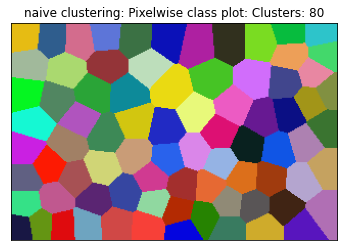

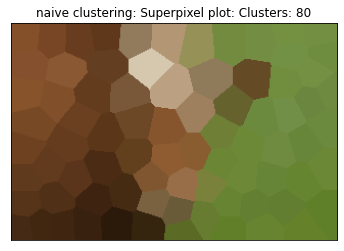

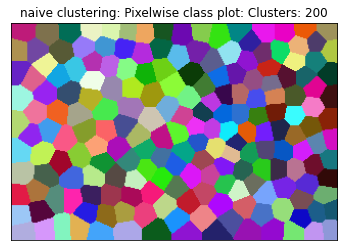

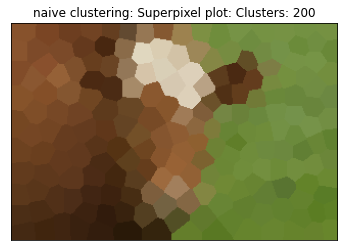

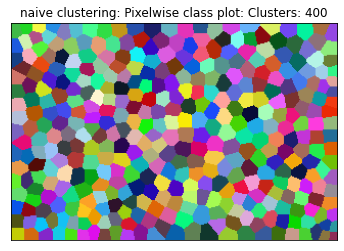

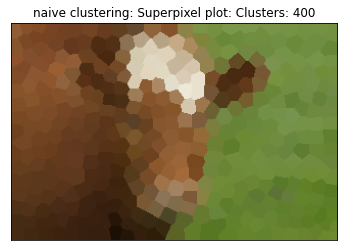

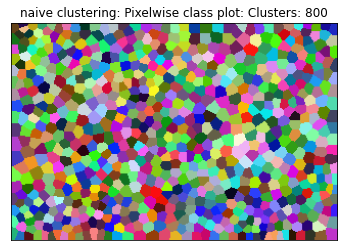

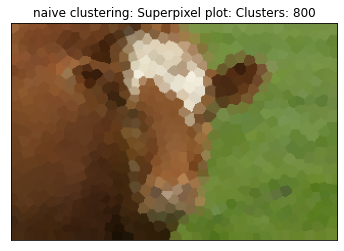

In [ ]:
for k in [20,80,200,400,800]:
    clusters = cluster_rgbxy(im,k)
    _ = rgb_segment(clusters,n = k, title =  "naive clustering: Pixelwise class plot: Clusters: " + str(k),legend = False)
    superpixel_plot(im,clusters,title =  "naive clustering: Superpixel plot: Clusters: "+ str(k))

In [ ]:
for image in [im2,im3,im4,im5,im6]:
  for k in [20,80,200,400,800]:
    clusters = cluster_rgbxy(image,k)
    _ = rgb_segment(clusters,n = k, title =  "naive clustering: Pixelwise class plot: Clusters: " + str(k),legend = False)
    superpixel_plot(image,clusters,title =  "naive clustering: Superpixel plot: Clusters: "+ str(k))

###  Modified k-means with weighted distances. 

 Let $cluster\_center_i$ represent $i^{th}$ cluster center, $cluster\_center_i^{rgb}$ denote the RGB value and $cluster\_center_i^{xy}$ be the corresponding coordinate of the center pixel, respectively.
 
 Let $x_{rgb}$ be the the RGB value of a pixel, and let $x_{xy}$ be the corresponding pixel's coordinate.
 <!-- Let $x_{xy}$ be the coordinate of $x_{rgb}$ -->

$distance(x_{rgb},x_{xy}) = \lambda_1 * euclidean(x_{rgb},cluster\_center_{i}^{rgb})  + \lambda_2 * euclidean(x_{xy},cluster\_center_{i}^{xy})$



Find good values for hyperparmeters $\lambda_1$ and $\lambda_2$ (try on 250 clusters)

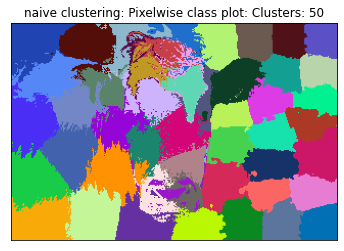

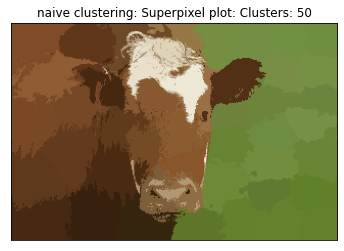

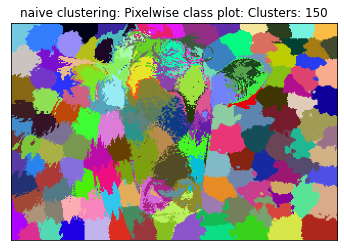

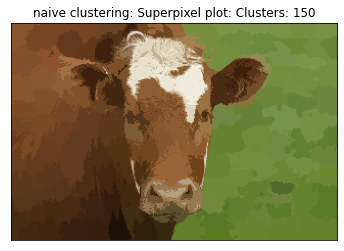

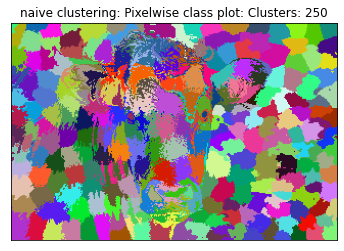

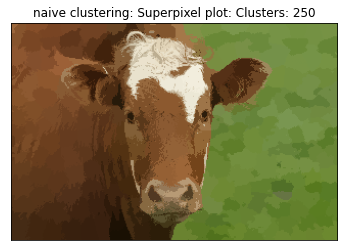

In [ ]:
#TODO: clustering r,b,g,x,y values with lambdas and display outputs
def cluster_rgbxy(im,K,lambda_1, lambda_2):
  # Make a copy of image
  im1 = im
    #Normalize the image
  # im = im / 255
  centroids = np.zeros((K,5))
  # Modify the image array to contain spatial coordinates along with rgb
  img_rgb_xy = np.ndarray((im.shape[0]*im.shape[1],5),dtype=float)
  for y in range(0,im.shape[0]):
    for x in range(0,im.shape[1]):
      img_rgb_xy[x+y*im.shape[1],0] = im[y][x][0]
      img_rgb_xy[x+y*im.shape[1],1] = im[y][x][1]
      img_rgb_xy[x+y*im.shape[1],2] = im[y][x][2]
      img_rgb_xy[x+y*im.shape[1],3] = x
      img_rgb_xy[x+y*im.shape[1],4] = y
  for i in range(K):
      centroids[i,:] = img_rgb_xy[np.random.randint(0,img_rgb_xy.shape[0]),:]
  for iters in range(10):
      # Initialize the pixel labels array
      pixel_labels = np.zeros((img_rgb_xy.shape[0],1),dtype=np.int32)
      # Initialize the distances array
      distances_from_centroids = np.zeros((img_rgb_xy.shape[0],K))

      for j in range(K):
          # calculate the Euclidian distances from every centroid's rgb to every pixel's rgb and centroids'xy to pixel's xy, combine them by hyperparmeters lambda1 and lambda2
        distances_from_centroids[:,j] = (lambda_1* np.sqrt(np.sum(np.power(img_rgb_xy[:,:3] - centroids[j,:3], 2), 1))) + (lambda_2*np.sqrt(np.sum(np.power(img_rgb_xy[:,3:] - centroids[j,3:], 2), 1)))
        # Assign every pixel in the image to the closest centroid based on the minimum distance
        pixel_labels = np.argmin(distances_from_centroids,axis=1)

      for j in range(K):
        centroid_pixel_values = img_rgb_xy[pixel_labels== j, :]
        # If no pixels hasnt been assigned to a centroid
        if len(centroid_pixel_values)==0:
          centroids[j,:] = img_rgb_xy[np.random.randint(0,img_rgb_xy.shape[0]),:]
        # calculate the new centroid by taking means of each clustered pixels 
        else:
          centroids[j,:] = np.mean(centroid_pixel_values,axis=0)
  # Convert the labels as 2D array
  pixel_labels = pixel_labels.reshape(im1.shape[0],im1.shape[1])
  return pixel_labels

for k in [50,150,250]:
    clusters = cluster_rgbxy(im,k,lambda_1=10,lambda_2=20)
    _ = rgb_segment(clusters,n = k, title =  "naive clustering: Pixelwise class plot: Clusters: " + str(k),legend = False)
    superpixel_plot(im,clusters,title =  "naive clustering: Superpixel plot: Clusters: "+ str(k))
 



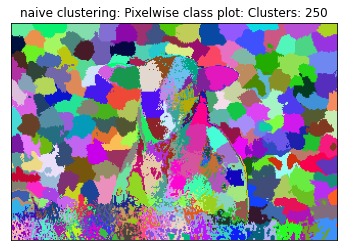

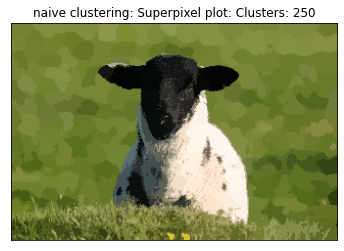

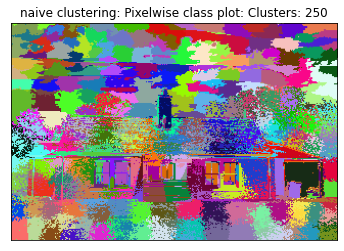

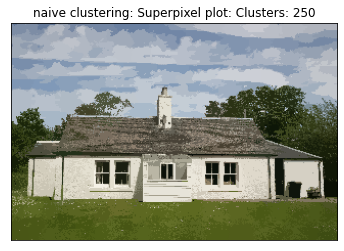

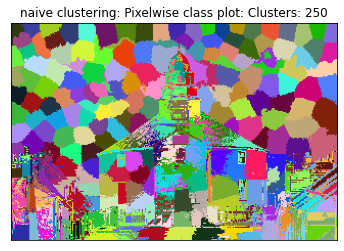

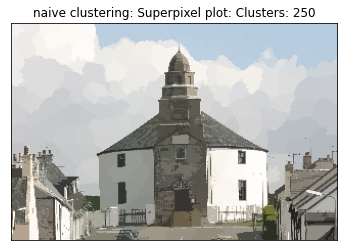

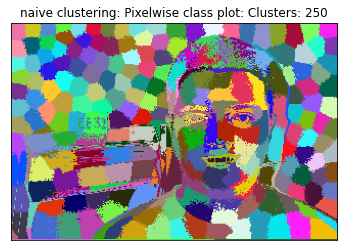

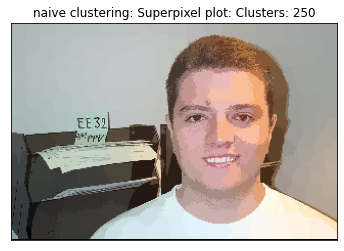

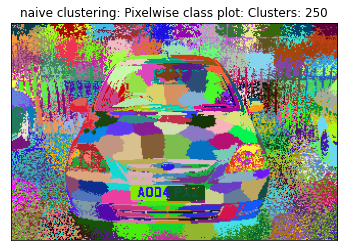

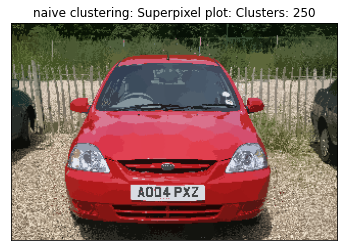

In [ ]:
for image in [im2,im3,im4,im5,im6]:
  for k in [250]:
    clusters = cluster_rgbxy(image,k,lambda_1=10,lambda_2=20)
    _ = rgb_segment(clusters,n = k, title =  "naive clustering: Pixelwise class plot: Clusters: " + str(k),legend = False)
    superpixel_plot(image,clusters,title =  "naive clustering: Superpixel plot: Clusters: "+ str(k))

###Question 3: SLIC

It doesn't look like we have a very favourable outcome with superpixels simply being implemented as K-means. Can we do better? Have a look at the SLIC paper [here](https://www.iro.umontreal.ca/~mignotte/IFT6150/Articles/SLIC_Superpixels.pdf). Incorporate S and m and redefine your distance metric as per the paper.


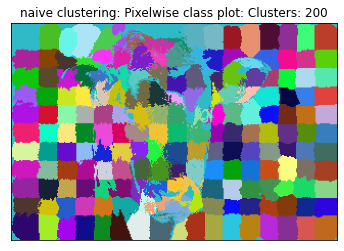

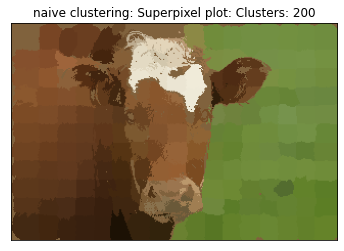

In [ ]:
#TODO
############Algorithm############
#Compute grid steps: S
#you can explore different values of m
#initialize cluster centers [l,a,b,x,y] using  
#Perturb for minimum G
#while not converged
##for every pixel:
####  compare distance D_s with each cluster center within 2S X 2S. 
####  Assign to nearest cluster
##calculate new cluster center 
 
def SLIC(im, K):
  # convert the image to lab space
  img = cv2.cvtColor(im, cv2.COLOR_BGR2LAB).astype(np.float64)
  # Run for 10 iterations
  max_iters = 10
  # Scale factor for x-y distances
  m = 40
  # No of pixels in an image
  N = img.shape[0]*img.shape[1]
  # Average size of the superpixel
  S = int(np.sqrt(N/K))
  # Create an array for the distances and clusters
  distances = np.ones(img.shape[:2])
  clusters =  np.zeros((img.shape[:2]))
  centroids = []
  # Initialize the centroids
  for i in range(S,im.shape[1]-int(S/2),S):
    for j in range(S,im.shape[0]-int(S/2),S):
      min_dist = 1
      min_pos = [i,j]
      for y_pos in range(i-1,i+2):
        for x_pos in range(j-1,j+2):
          center1 = img[x_pos+1,y_pos]
          center2 = img[x_pos,y_pos+1]
          center3 = img[x_pos,y_pos]
          if ((center1[0] - center3[0])**2)**0.5 + ((center2[0] - center3[0])**2)**0.5 < min_dist:
            min_dist = abs(center1[0]-center3[0])+abs(center2[0]-center3[0])
            min_pos = [y_pos,x_pos]

      centroids.append([img[min_pos[1],min_pos[0]][0],img[min_pos[1],min_pos[0]][1],img[min_pos[1],min_pos[0]][2],min_pos[0],min_pos[1]])
  centroids_array = np.array(centroids)
  # Create a mesh grid
  indnp = np.mgrid[0:img.shape[0],0:img.shape[1]].swapaxes(0,2).swapaxes(0,1)
  for _ in range(max_iters):
    # for c in range(1):
    distances = np.ones(img.shape[:2])
    for c in range(centroids_array.shape[0]):
      x_min, y_min = int(centroids_array[c][3]-S),int(centroids_array[c][4]-S)
      x_max, y_max = int(centroids_array[c][3]+S),int(centroids_array[c][4]+S)
      # Limit the min and max values from 0 to height and width
      if x_min <= 0:
        x_min =0
      if x_max>img.shape[1]:
        x_max=img.shape[1]
      if y_min <=0:
        y_min=0
      if y_max>img.shape[0]:
        y_max=img.shape[0]
      
      # Calculate the distances between pixel's lab values
      d_lab_ = img[y_min:y_max,x_min:x_max] - img[int(centroids_array[c][4]),int(centroids_array[c][3])]
      d_lab = np.sqrt(np.sum(d_lab_**2,axis=2))

      y_values = []
      x_values = []


      for y_ in range(y_min,y_max):
        y_values.append([y_])
      y_values = np.array(y_values)
      for x_ in range(x_min,x_max):
        x_values.append(x_)
      x_values = np.array(x_values)

      # calculate the distance between pixel's coordinate values
      d_xy = ((y_values-centroids_array[c][4])**2+(x_values-centroids_array[c][3])**2)**0.5
      # combine the distances my introducing m and S
      ds = ((d_lab/m)**2 + (d_xy/S)**2)**0.5
      # Take the min distance and update the centroids
      distance_crop = distances[y_min : y_max, x_min : x_max]
      idx = ds<distance_crop
      distance_crop[idx] = ds[idx]
      
      distances[y_min : y_max, x_min : x_max] = distance_crop
      clusters[y_min : y_max, x_min: x_max][idx] = c
      

    for h in range(len(centroids_array)):
      idx = (clusters==h)
      rgb_clusters = img[idx]
      xy_clusters = indnp[idx]
      #updating the centroids by taking mean along rgb axes and xy axes seperately
      centroids_array[h][0:3] = np.sum(rgb_clusters, axis=0)
      sumy, sumx = np.sum(xy_clusters, axis=0)
      centroids_array[h][3:] = sumx, sumy
      centroids_array[h] /= np.sum(idx) 
    return clusters
  
for k in [200]:
  clusters = SLIC(im,k)
  _ = rgb_segment(clusters,n = k, title =  "naive clustering: Pixelwise class plot: Clusters: " + str(k),legend = False)
  superpixel_plot(im,clusters,title =  "naive clustering: Superpixel plot: Clusters: "+ str(k))


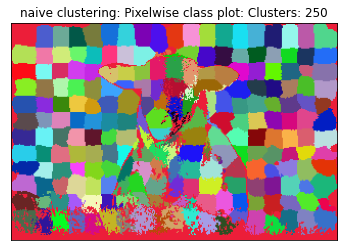

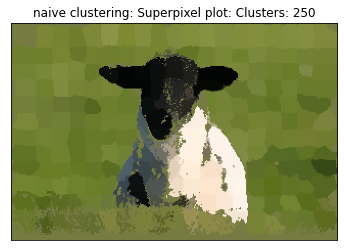

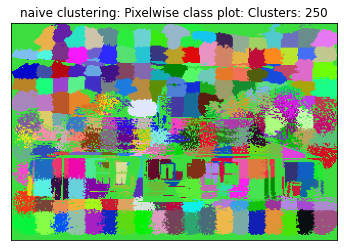

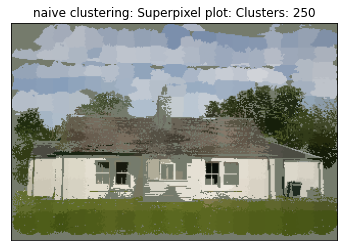

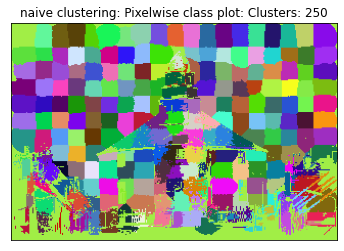

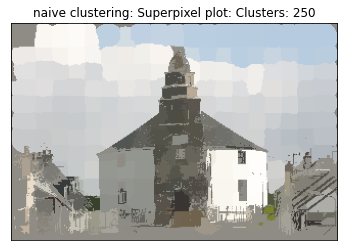

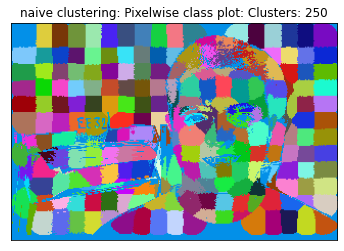

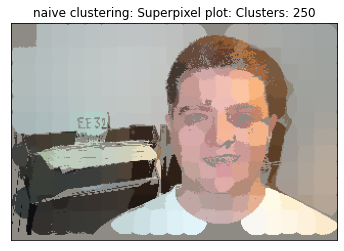

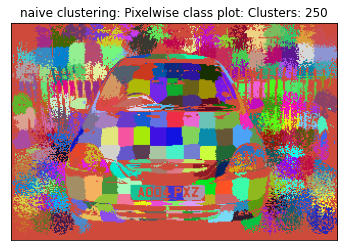

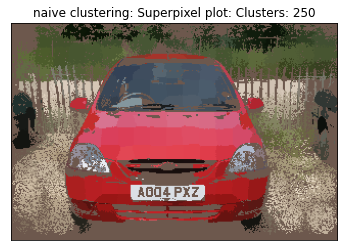

In [ ]:
for image in [im2,im3,im4,im5,im6]:
  for k in [250]:
    clusters = SLIC(image,k)
    _ = rgb_segment(clusters,n = k, title =  "naive clustering: Pixelwise class plot: Clusters: " + str(k),legend = False)
    superpixel_plot(image,clusters,title =  "naive clustering: Superpixel plot: Clusters: "+ str(k))

## Bonus Question:
Enforce connectivity: There are many superpixels which are very small and disconnected from each other. Try to merge them with larger superpixels

O(N) algorithm:
1. Set a minimum size of superpixel
2. If the area of a region is smaller than a threshold, we assign it to the nearest cluster 


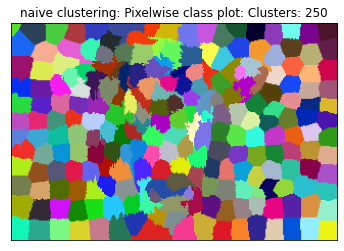

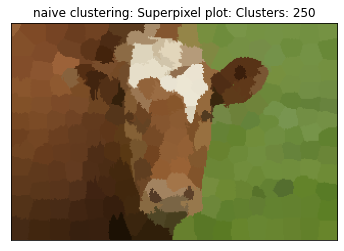

In [ ]:
#TODO
def enforce_connectivity(im,K):
    # convert the image to lab space
  img = cv2.cvtColor(im, cv2.COLOR_BGR2LAB).astype(np.float64)
  # Run for 10 iterations
  max_iters = 10
  # Scale factor for x-y distances
  m = 40
  # No of pixels in an image
  N = img.shape[0]*img.shape[1]
  # Average size of the superpixel
  S = int(np.sqrt(N/K))
  # Create an array for the distances and clusters
  distances = np.ones(img.shape[:2])
  clusters =  np.zeros((img.shape[:2]))
  centroids = []
  # Initialize the centroids
  for i in range(S,im.shape[1]-int(S/2),S):
    for j in range(S,im.shape[0]-int(S/2),S):
      min_dist = 1
      min_pos = [i,j]
      for y_pos in range(i-1,i+2):
        for x_pos in range(j-1,j+2):
          center1 = img[x_pos+1,y_pos]
          center2 = img[x_pos,y_pos+1]
          center3 = img[x_pos,y_pos]
          if ((center1[0] - center3[0])**2)**0.5 + ((center2[0] - center3[0])**2)**0.5 < min_dist:
            min_dist = abs(center1[0]-center3[0])+abs(center2[0]-center3[0])
            min_pos = [y_pos,x_pos]

      centroids.append([img[min_pos[1],min_pos[0]][0],img[min_pos[1],min_pos[0]][1],img[min_pos[1],min_pos[0]][2],min_pos[0],min_pos[1]])
  centroids_array = np.array(centroids)
  # Create a mesh grid
  indnp = np.mgrid[0:img.shape[0],0:img.shape[1]].swapaxes(0,2).swapaxes(0,1)
  for _ in range(max_iters):
    # for c in range(1):
    distances = np.ones(img.shape[:2])
    for c in range(centroids_array.shape[0]):
      x_min, y_min = int(centroids_array[c][3]-S),int(centroids_array[c][4]-S)
      x_max, y_max = int(centroids_array[c][3]+S),int(centroids_array[c][4]+S)
      # Limit the min and max values from 0 to height and width
      if x_min <= 0:
        x_min =0
      if x_max>img.shape[1]:
        x_max=img.shape[1]
      if y_min <=0:
        y_min=0
      if y_max>img.shape[0]:
        y_max=img.shape[0]
      
      # Calculate the distances between pixel's lab values
      d_lab_ = img[y_min:y_max,x_min:x_max] - img[int(centroids_array[c][4]),int(centroids_array[c][3])]
      d_lab = np.sqrt(np.sum(d_lab_**2,axis=2))

      y_values = []
      x_values = []


      for y_ in range(y_min,y_max):
        y_values.append([y_])
      y_values = np.array(y_values)
      for x_ in range(x_min,x_max):
        x_values.append(x_)
      x_values = np.array(x_values)

      # calculate the distance between pixel's coordinate values
      d_xy = ((y_values-centroids_array[c][4])**2+(x_values-centroids_array[c][3])**2)**0.5
      # combine the distances my introducing m and S
      ds = ((d_lab/m)**2 + (d_xy/S)**2)**0.5
      # Take the min distance and update the centroids
      distance_crop = distances[y_min : y_max, x_min : x_max]
      idx = ds<distance_crop
      distance_crop[idx] = ds[idx]
      
      distances[y_min : y_max, x_min : x_max] = distance_crop
      clusters[y_min : y_max, x_min: x_max][idx] = c
      

    for h in range(len(centroids_array)):
      idx = (clusters==h)
      rgb_clusters = img[idx]
      xy_clusters = indnp[idx]
      #updating the centroids by taking mean along rgb axes and xy axes seperately
      centroids_array[h][0:3] = np.sum(rgb_clusters, axis=0)
      sumy, sumx = np.sum(xy_clusters, axis=0)
      centroids_array[h][3:] = sumx, sumy
      centroids_array[h] /= np.sum(idx)

  #Enforce connectivity by checking the area and assigning nearby pixels to the same cluster
  pix_label = 0
  near_pix_label = 0
  connected_clusters = -1* np.ones(im.shape[:2]).astype(np.int64)
  pixel_elements = []
  for i in range(im.shape[1]):
    for j in range(im.shape[0]):
      if connected_clusters[j,i]==-1:
        pixel_elements = []
        pixel_elements.append((j,i))
        for dx,dy in [(-1,0),(0,-1),(1,0),(0,1)]:
          x_pix = pixel_elements[0][1]+dx
          y_pix = pixel_elements[0][0]+dy
          if(x_pix>=0 and x_pix<im.shape[1] and y_pix>=0 and y_pix<im.shape[0] and connected_clusters[y_pix,x_pix]>=0):
            near_pix_label = connected_clusters[y_pix,x_pix]
      count=1
      b=0
      while(b<count):
        for dx,dy in [(-1,0),(0,-1),(1,0),(0,1)]:
          x_pix = pixel_elements[b][1]+dx
          y_pix = pixel_elements[b][0]+dy
          if x_pix>=0 and x_pix<im.shape[1] and y_pix>=0 and y_pix<im.shape[0]:
            if connected_clusters[y_pix,x_pix]==-1 and clusters[j,i]==clusters[y_pix,x_pix]:
              pixel_elements.append((y_pix,x_pix))
              connected_clusters[y_pix,x_pix]=pix_label
              count+=1
        b+=1
      if (count<=int(im.shape[1] * im.shape[0] / centroids_array.shape[0])>>2):
        for b in range(count):
          connected_clusters[pixel_elements[b]]=near_pix_label

        pix_label-=1
      pix_label+=1
  return connected_clusters
              
            
for k in [250]:
  clusters = enforce_connectivity(im,k)
  _ = rgb_segment(clusters,n = k, title =  "naive clustering: Pixelwise class plot: Clusters: " + str(k),legend = False)
  superpixel_plot(im,clusters,title =  "naive clustering: Superpixel plot: Clusters: "+ str(k))



  




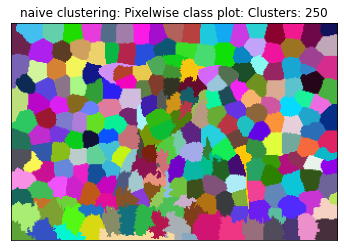

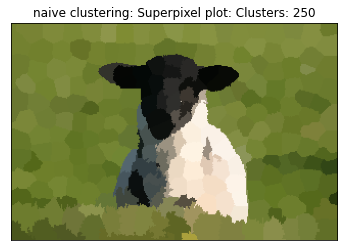

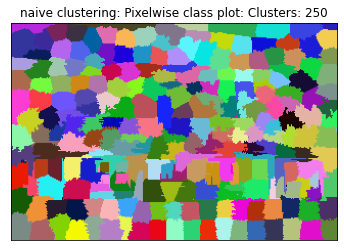

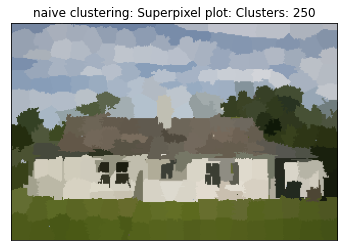

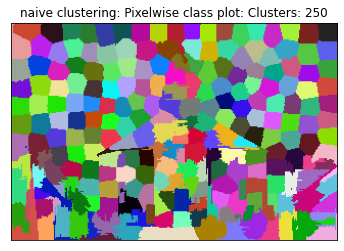

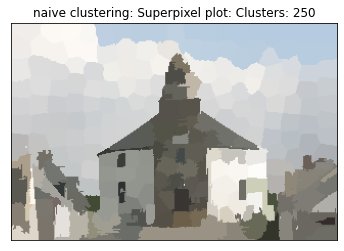

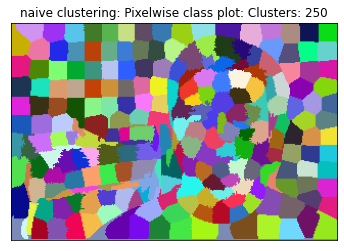

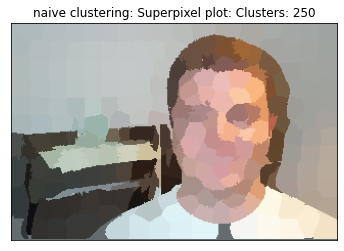

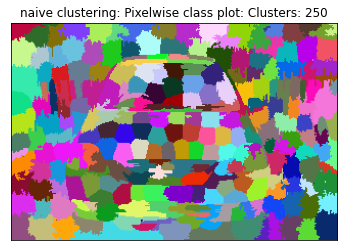

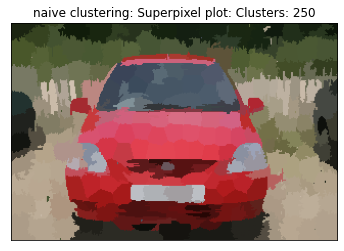

In [ ]:
for image in [im2,im3,im4,im5,im6]:
  for k in [250]:
    clusters = enforce_connectivity(image,k)
    _ = rgb_segment(clusters,n = k, title =  "naive clustering: Pixelwise class plot: Clusters: " + str(k),legend = False)
    superpixel_plot(image,clusters,title =  "naive clustering: Superpixel plot: Clusters: "+ str(k))

## Your File
Link to your colab/ipynb file: 
https://colab.research.google.com/drive/1BAM0F25MJxOzgGEN8cBNuhwPIby2AqT9?usp=sharing


